In [2]:
# Hvor meget strøm er der blevet brugt af alle nodes
# Hvor meget strøm der er genereret af PV
# Hvor strøm der er hentet fra grid


# Kommer batterier nogensinde til 100% - Svar: JA
# Exporter vi nogensinde strøm til grid - Svar: NEJ

In [3]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator, FormatStrFormatter, FuncFormatter
import seaborn as sns
import os

#PATH_PLUGIN = '../results/plugin/25may-5xspeed-withplugin/logs/'
PATH_PLUGIN = '../results/plugin/2jun-30xspeed-withplugin-020pods/logs/'
PATH_DEFAULT_SCHEDULER = '../results/default-scheduler/26may-5xspeed-withoutplugin/logs/'

battery_cols = ['battery', 'battery.1', 'battery.2', 'battery.3', 'battery.4']
node_cols = ['node', 'node.1', 'node.2', 'node.3', 'node.4', 'node.5', 'node.6', 'node.7', 'node.8', 'node.9', 'node.10', 'node.11', 'node.12', 'node.13', 'node.14', 'node.15', 'node.16', 'node.17']
pv_cols = ['pv_source', 'pv_source.1', 'pv_source.2', 'pv_source.3']
grid_cols = ['grid', 'grid.1', 'grid.2', 'grid.3', 'grid.4', 'grid.5', 'grid.6', 'grid.7']
balancing_cols = ['balancing', 'balancing.1', 'balancing.2']
balance_cols = ['balance', 'balance.1', 'balance.2', 'balance.3', 'balance.4', 'balance.5', 'balance.6', 'balance.7', 'balance.8', 'balance.9']


## Generate a dict for each microgrid

In [4]:
gridnames = pd.read_csv('../data/gridnames.csv')
names = gridnames['Gridname'].to_list()

test_df = pd.read_csv('../logs/XK00.csv')

dataframes_plugin = {}
dataframes_default_scheduler = {}


for name in names:
    file_path = os.path.join(PATH_PLUGIN, f"{name}.csv")
    if os.path.exists(file_path):
        dataframes_plugin[name] = pd.read_csv(file_path)
    else:
        print(f"Warning: File {file_path} does not exist.")

for name in names:
    file_path = os.path.join(PATH_DEFAULT_SCHEDULER, f"{name}.csv")
    if os.path.exists(file_path):
        dataframes_default_scheduler[name] = pd.read_csv(file_path)
    else:
        print(f"Warning: File {file_path} does not exist.")




## Battery Dataframes

In [5]:
battery_dataframes_plugin = {}
battery_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in battery_cols if col in df.columns]
    battery_dataframes_scheduler[name] = df[existing_cols]


### Rename headers

In [6]:
for key, df in battery_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_plugin[key] = df

for key, df in battery_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    battery_dataframes_scheduler[key] = df


battery_dataframes_plugin['AL00']


1,charge_amount,current_charge,discharge_amount,reward,soc
0,0.000000,11648.350000,720.0,-0.0,0.500000
1,0.000000,10928.350000,720.0,-0.0,0.469094
2,0.000000,10208.350000,720.0,-0.0,0.438189
3,0.000000,9488.350000,720.0,-0.0,0.407283
4,0.000000,8768.350000,720.0,-0.0,0.376377
...,...,...,...,...,...
2781,0.000000,0.000000,0.0,-0.0,0.000000
2782,0.000000,0.000000,0.0,-0.0,0.000000
2783,0.000000,0.000000,0.0,-0.0,0.000000
2784,581.867104,0.000000,0.0,-0.0,0.000000


### Plot figures (SOC)

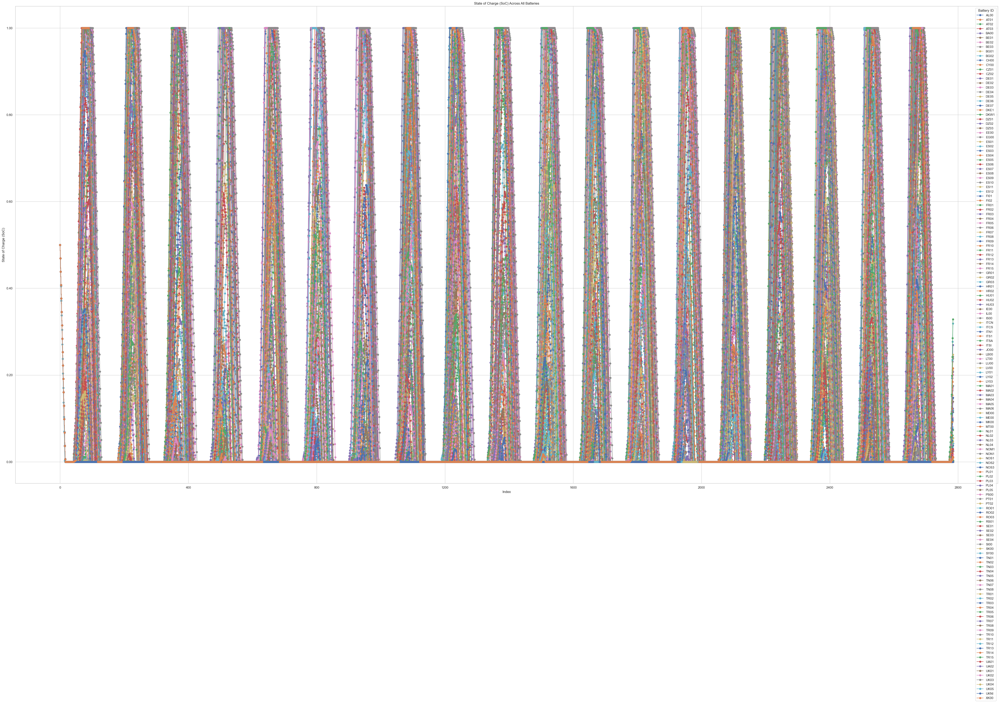

In [7]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in battery_dataframes_plugin.items():
    if 'soc' not in df.columns:
        print(f"Skipping {key}: no 'soc' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['soc'] = pd.to_numeric(df['soc'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['soc'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("State of Charge (SoC) Across All Batteries")
plt.xlabel("Index")
plt.ylabel("State of Charge (SoC)")
plt.grid(True)
plt.legend(title="Battery ID")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Grid Dataframes

In [8]:
grid_dataframes_plugin = {}
grid_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in grid_cols if col in df.columns]
    grid_dataframes_scheduler[name] = df[existing_cols]

### Rename headers

In [9]:
for key, df in grid_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_plugin[key] = df

for key, df in grid_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    grid_dataframes_scheduler[key] = df


grid_dataframes_plugin['AL00']

1,co2_per_kwh_current,co2_production,export_price_current,grid_export,grid_import,grid_status_current,import_price_current,reward
0,999.0,0.000000,0.000876,0.0,0.000000,1.0,0.000973,-0.00000
1,999.0,0.000000,0.000876,0.0,0.000000,1.0,0.000973,-0.00000
2,999.0,0.000000,0.000876,0.0,0.000000,1.0,0.000973,-0.00000
3,999.0,0.000000,0.000876,0.0,0.000000,1.0,0.000973,-0.00000
4,999.0,0.000000,0.000876,0.0,0.000000,1.0,0.000973,-0.00000
...,...,...,...,...,...,...,...,...
2781,999.0,93420.958104,0.000876,0.0,93.514473,1.0,0.000973,-0.09099
2782,999.0,93420.958104,0.000876,0.0,93.514473,1.0,0.000973,-0.09099
2783,999.0,93420.958104,0.000876,0.0,93.514473,1.0,0.000973,-0.09099
2784,999.0,0.000000,0.000876,0.0,0.000000,1.0,0.000973,-0.00000


### Plot figures (Export, Import, CO2 Production)

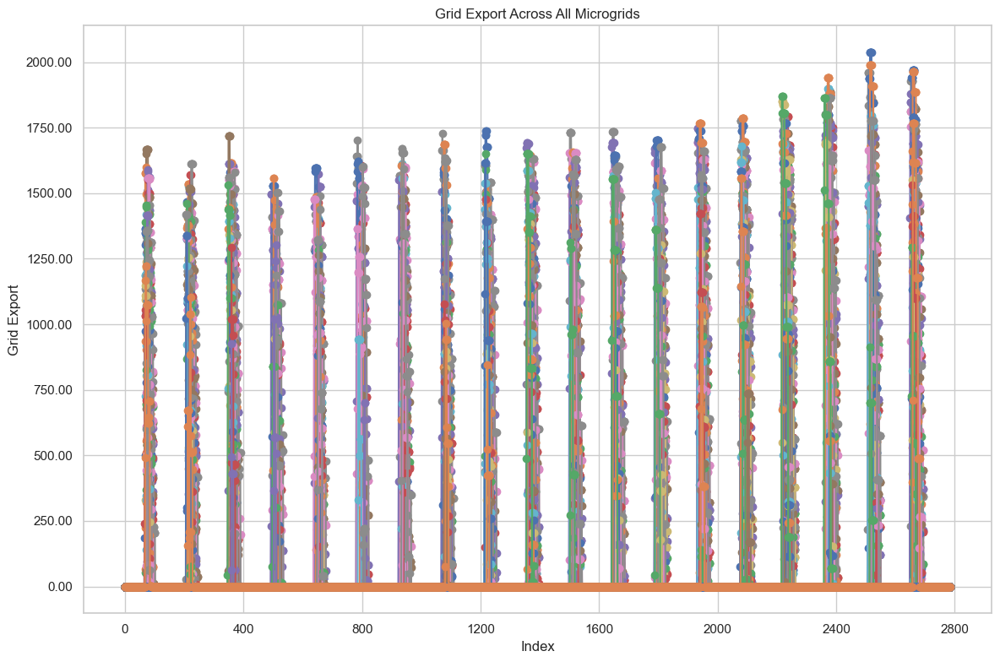

In [10]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_export' not in df.columns:
        print(f"Skipping {key}: no 'grid_export' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_export'] = pd.to_numeric(df['grid_export'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_export'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Grid Export Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Export")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

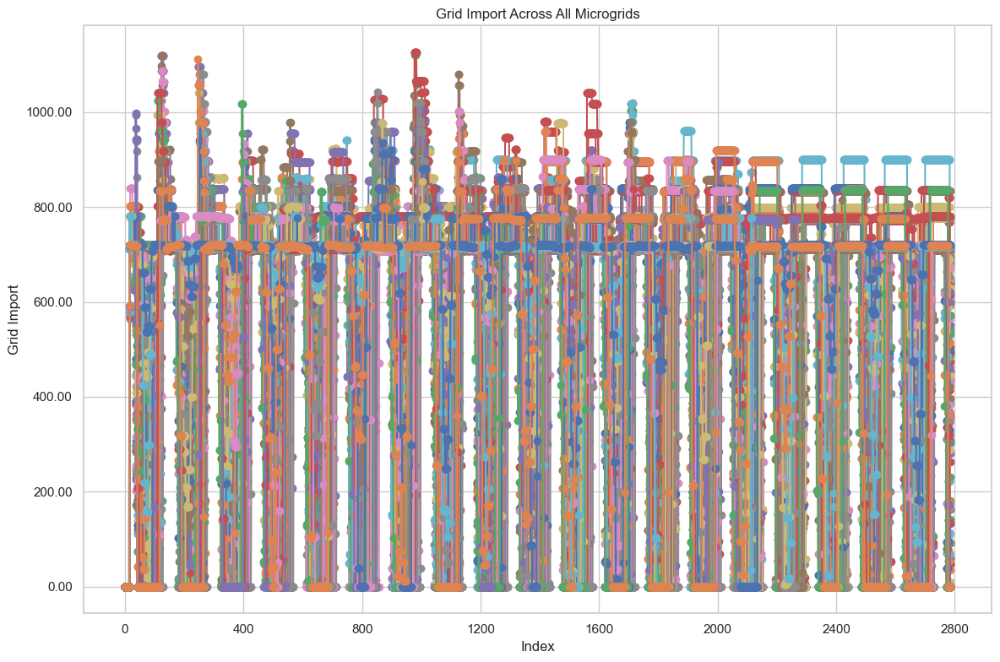

In [11]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in grid_dataframes_plugin.items():
    if 'grid_import' not in df.columns:
        print(f"Skipping {key}: no 'grid_import' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['grid_import'] = pd.to_numeric(df['grid_import'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['grid_import'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Grid Import Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Grid Import")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## PV Dataframes

In [12]:
pv_dataframes_plugin = {}
pv_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in pv_cols if col in df.columns]
    pv_dataframes_scheduler[name] = df[existing_cols]

In [13]:
for key, df in pv_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_plugin[key] = df

for key, df in pv_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    pv_dataframes_scheduler[key] = df


pv_dataframes_scheduler['AL00']

1,curtailment,renewable_current,renewable_used,reward
0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0
...,...,...,...,...
387,0.0,0.0,0.0,0.0
388,0.0,0.0,0.0,0.0
389,0.0,0.0,0.0,0.0
390,0.0,0.0,0.0,0.0


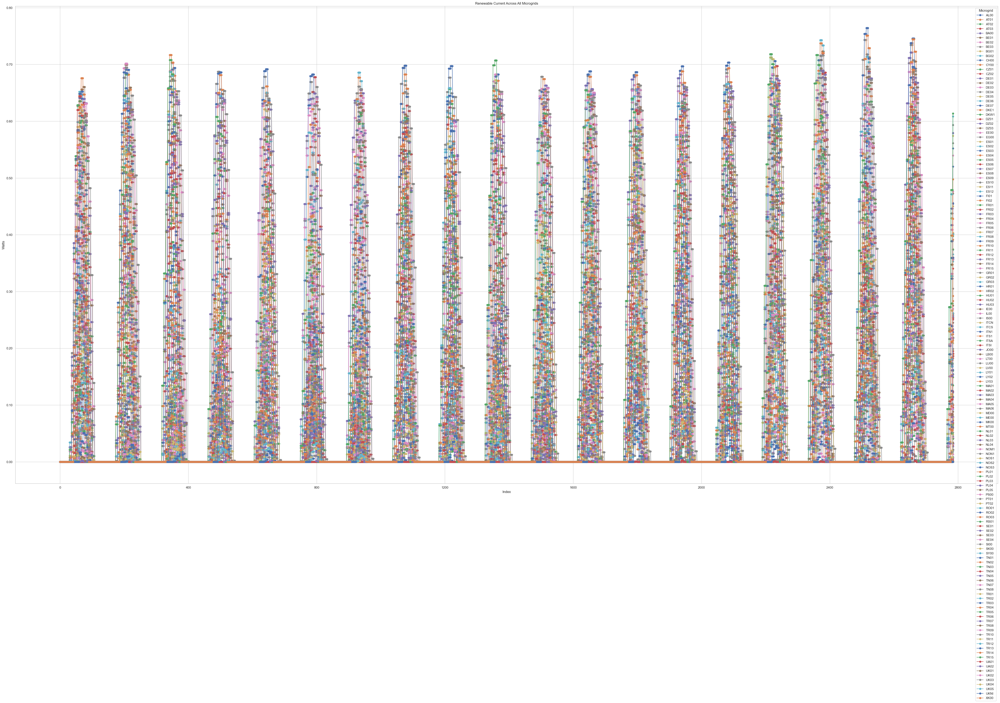

In [14]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame and plot its 'soc' column
for key, df in pv_dataframes_plugin.items():
    if 'renewable_current' not in df.columns:
        print(f"Skipping {key}: no 'renewable_current' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['renewable_current'] = pd.to_numeric(df['renewable_current'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['renewable_current'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Renewable Current Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Nodes Dataframes

In [15]:
nodes_dataframes_plugin = {}
nodes_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in node_cols if col in df.columns]
    nodes_dataframes_scheduler[name] = df[existing_cols]

In [16]:
for key, df in nodes_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_plugin[key] = df

for key, df in nodes_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    nodes_dataframes_scheduler[key] = df


nodes_dataframes_scheduler['TR10']

1,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward,load_met,node_current,reward
0,120,-59.481963,0.0,120,-44.877580,0.0,120,-0.759295,0.0,120,-57.871521,0.0,120,-46.647117,0.0,120,-50.763622,0.0
1,120,-36.507199,0.0,120,-34.833665,0.0,120,-53.812142,0.0,120,-48.563753,0.0,120,-54.285852,0.0,120,-35.981958,0.0
2,120,-16.613206,0.0,120,-46.614458,0.0,120,-29.666297,0.0,120,-50.495262,0.0,120,-41.286534,0.0,120,-42.737372,0.0
3,120,-17.862433,0.0,120,-1.337987,0.0,120,-35.536769,0.0,120,-0.124600,0.0,120,-47.950001,0.0,120,-4.497583,0.0
4,120,-18.442951,0.0,120,-2.053270,0.0,120,-30.384277,0.0,120,-32.998274,0.0,120,-0.684689,0.0,120,-54.960032,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
387,120,-3.010589,0.0,120,-8.611803,0.0,120,-32.269773,0.0,120,-48.987008,0.0,120,-36.067063,0.0,120,-28.973140,0.0
388,120,-30.908347,0.0,120,-21.822232,0.0,120,-11.569733,0.0,120,-38.707092,0.0,120,-18.014822,0.0,120,-13.423643,0.0
389,120,-27.709871,0.0,120,-29.558115,0.0,120,-32.012628,0.0,120,-43.846764,0.0,120,-23.623604,0.0,120,-52.916817,0.0
390,120,-40.440596,0.0,120,-24.392327,0.0,120,-33.286459,0.0,120,-48.506600,0.0,120,-11.343001,0.0,120,-19.568709,0.0


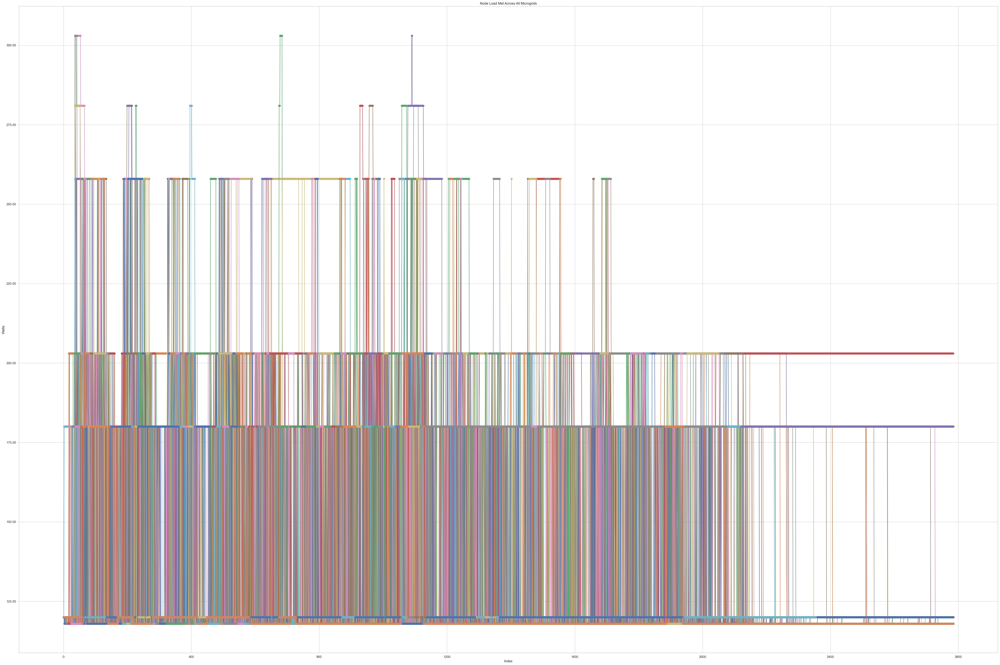

In [17]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(48, 32))

# Loop over each DataFrame
for key, df in nodes_dataframes_plugin.items():
    # Find all column indices where the name is 'load_met'
    load_met_indices = [i for i, col in enumerate(df.columns) if col == 'load_met']
    
    if not load_met_indices:
        print(f"Skipping {key}: no 'load_met' columns found.")
        continue

    # Plot each 'load_met' column individually
    for idx_num, col_idx in enumerate(load_met_indices, 1):
        col_data = pd.to_numeric(df.iloc[:, col_idx], errors='coerce')
        label = f"{key} - load_met {idx_num}" if len(load_met_indices) > 1 else f"{key}"
        plt.plot(df.index, col_data, marker='o', linestyle='-', label=label)

# Customize plot
plt.title("Node Load Met Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Balancing Dataframes

In [18]:
balancing_dataframes_plugin = {}
balancing_dataframes_scheduler = {}

for name, df in dataframes_plugin.items():
    existing_cols = [col for col in balancing_cols if col in df.columns]
    balancing_dataframes_plugin[name] = df[existing_cols]

for name, df in dataframes_default_scheduler.items():
    existing_cols = [col for col in balancing_cols if col in df.columns]
    balancing_dataframes_scheduler[name] = df[existing_cols]

In [19]:
for key, df in balancing_dataframes_plugin.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    balancing_dataframes_plugin[key] = df

for key, df in balancing_dataframes_scheduler.items():
    df.columns = df.iloc[1]
    df = df.drop(index=[0, 1]).reset_index(drop=True)
    df = df.apply(pd.to_numeric, errors='ignore')
    balancing_dataframes_scheduler[key] = df


balancing_dataframes_scheduler['TR10']

1,loss_load,overgeneration,reward
0,0.0,0.0,-0.0
1,0.0,0.0,-0.0
2,0.0,0.0,-0.0
3,0.0,0.0,-0.0
4,0.0,0.0,-0.0
...,...,...,...
387,0.0,0.0,-0.0
388,0.0,0.0,-0.0
389,0.0,0.0,-0.0
390,0.0,0.0,-0.0


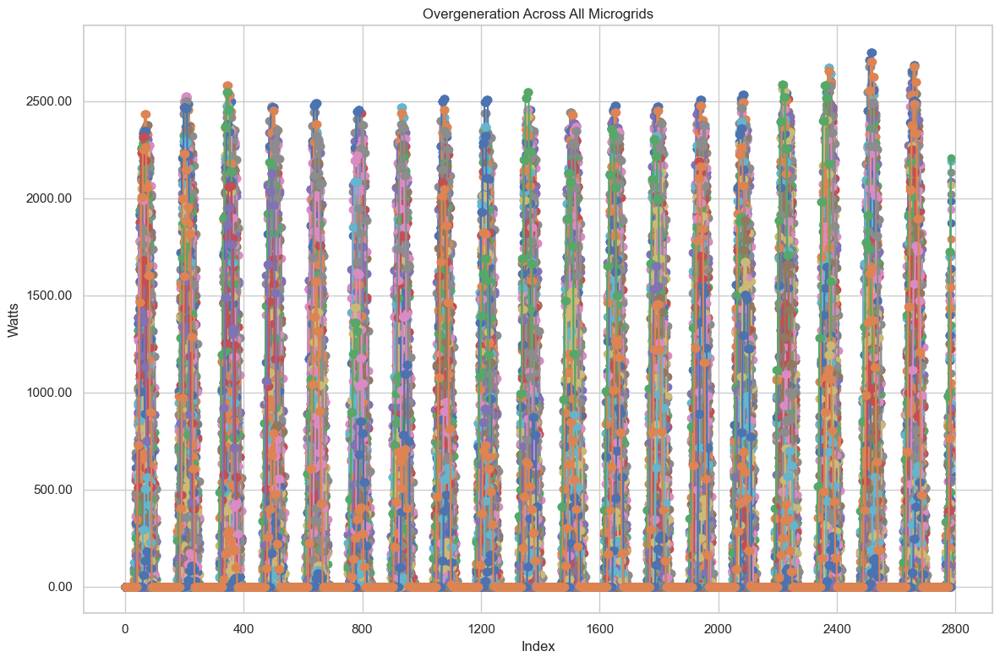

In [20]:
# Set seaborn style
sns.set(style="whitegrid")

# Create a new figure
plt.figure(figsize=(12, 8))

# Loop over each DataFrame and plot its 'soc' column
for key, df in balancing_dataframes_plugin.items():
    if 'loss_load' not in df.columns:
        print(f"Skipping {key}: no 'loss_load' column found.")
        continue

    # Convert 'soc' to numeric if necessary
    df['loss_load'] = pd.to_numeric(df['loss_load'], errors='coerce')

    # Plot with label
    plt.plot(df.index, df['loss_load'], marker='o', linestyle='-', label=key)

# Customize plot
plt.title("Overgeneration Across All Microgrids")
plt.xlabel("Index")
plt.ylabel("Watts")
plt.grid(True)
#plt.legend(title="Microgrid")
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Explore relation between PV Generation, Battery current_charge, grid import/export

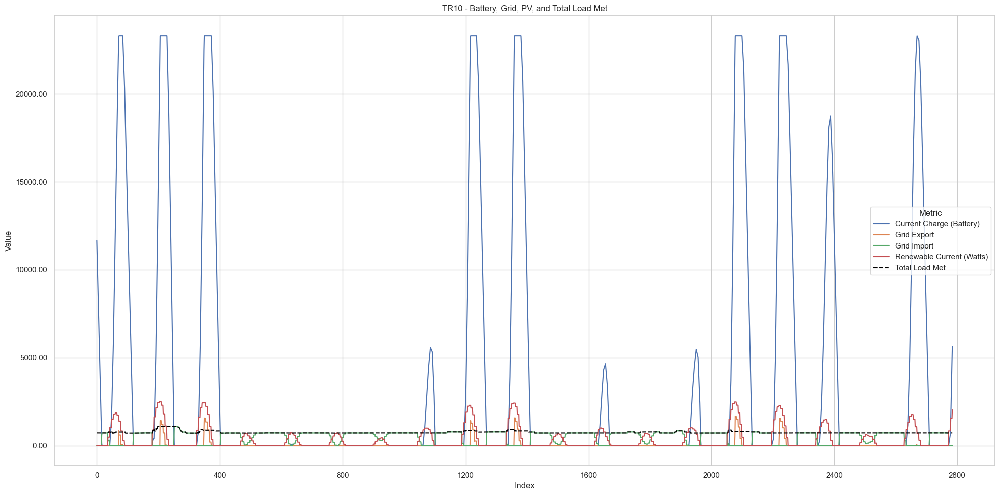

In [21]:
# Set Seaborn style
sns.set(style="whitegrid")

# Extract the relevant DataFrames
battery_df = battery_dataframes_plugin.get('TR10')
grid_df = grid_dataframes_plugin.get('TR10')
pv_df = pv_dataframes_plugin.get('TR10')
nodes_df = nodes_dataframes_plugin.get('TR10')

# Check that all exist
if battery_df is None or grid_df is None or pv_df is None or nodes_df is None:
    raise ValueError("One or more dataframes for 'TR10' are missing.")

# Convert necessary columns to numeric
battery_df['current_charge'] = pd.to_numeric(battery_df['current_charge'], errors='coerce')
grid_df['grid_export'] = pd.to_numeric(grid_df['grid_export'], errors='coerce')
grid_df['grid_import'] = pd.to_numeric(grid_df['grid_import'], errors='coerce')
pv_df['renewable_current'] = pd.to_numeric(pv_df['renewable_current'], errors='coerce')

# Scale renewable_current to watt-hours (assuming it's energy per second)
pv_df['renewable_current_watts'] = pv_df['renewable_current'] * 3600

# Sum all 'load_met' columns from nodes_df (handling duplicates)
load_met_indices = [i for i, col in enumerate(nodes_df.columns) if col == 'load_met']
if not load_met_indices:
    print("No 'load_met' columns found in nodes_df for TR10.")
    total_load_met = None
else:
    # Sum all matching columns across the rows
    load_met_df = nodes_df.iloc[:, load_met_indices].apply(pd.to_numeric, errors='coerce')
    total_load_met = load_met_df.sum(axis=1)

# Create the plot
plt.figure(figsize=(20, 10))

# Plot each series from its respective DataFrame
plt.plot(battery_df.index, battery_df['current_charge'], label='Current Charge (Battery)')
plt.plot(grid_df.index, grid_df['grid_export'], label='Grid Export')
plt.plot(grid_df.index, grid_df['grid_import'], label='Grid Import')
plt.plot(pv_df.index, pv_df['renewable_current_watts'], label='Renewable Current (Watts)')

# Plot summed load_met if available
if total_load_met is not None:
    plt.plot(nodes_df.index, total_load_met, label='Total Load Met', linestyle='--', color='black')

# Customize the plot
plt.title("TR10 - Battery, Grid, PV, and Total Load Met")
plt.xlabel("Index")
plt.ylabel("Value")
plt.legend(title="Metric")
plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
plt.tight_layout()
plt.show()

## Checking if grid import/export is active

In [22]:
test_df.columns

battery_test = test_df[battery_cols]
grid_test = test_df[grid_cols]
pv_test = test_df[pv_cols]

battery_test = battery_test.drop([0, 1])
battery_test # battery.1 = current_charge

grid_test = grid_test.drop([0, 1])
grid_test # grid.3 export, grid.4 import

pv_test = pv_test.drop([0, 1])
pv_test # pv_source.1 renewable_current

battery_test = battery_test.apply(pd.to_numeric, errors='coerce')
grid_test = grid_test.apply(pd.to_numeric, errors='coerce')
pv_test = pv_test.apply(pd.to_numeric, errors='coerce')



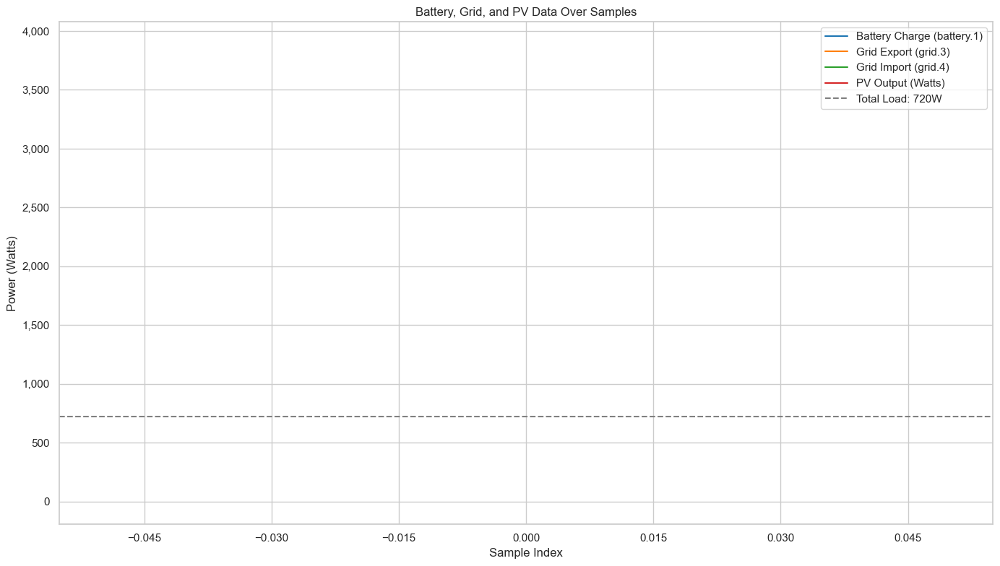

In [23]:
# Optional: set Seaborn style
sns.set(style="whitegrid")

# Adjust pv_source.1 to watts (assuming it's % of 3600 W capacity)
pv_watts = pv_test['pv_source.1'] * 3600

# Combine the relevant columns into one DataFrame
combined_df = pd.DataFrame({
    'Battery Charge (battery.1)': battery_test['battery.1'],
    'Grid Export (grid.3)': grid_test['grid.3'],
    'Grid Import (grid.4)': grid_test['grid.4'],
    'PV Output (Watts)': pv_watts
}).reset_index(drop=True)  # So x-axis is 0...N-1

# Create the plot
plt.figure(figsize=(14, 8))
palette = sns.color_palette("tab10")

for i, column in enumerate(combined_df.columns):
    plt.plot(combined_df.index, combined_df[column], label=column, color=palette[i])

# Add a horizontal dotted line at y = 720
plt.axhline(y=720, color='gray', linestyle='--', linewidth=1.5, label='Total Load: 720W')

# Add a vertical dotted line and annotation at x = 62
x_pos = 62
if x_pos < len(combined_df):
    y1 = combined_df.loc[x_pos, 'PV Output (Watts)']
    y2 = combined_df.loc[x_pos, 'Grid Export (grid.3)']
    
    # Vertical line
    plt.plot([x_pos, x_pos], [y1, y2], color='black', linestyle=':', linewidth=2, label='Δ at x=62')
    
    # Annotate difference
    diff = abs(y1 - y2)
    mid_y = (y1 + y2) / 2
    plt.text(x_pos + 1, mid_y, f'{diff:.0f} W', va='center', ha='left', fontsize=10,
             color='black', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.3'))

# Format axes
plt.xlabel('Sample Index')
plt.ylabel('Power (Watts)')
plt.title('Battery, Grid, and PV Data Over Samples')
plt.legend()
plt.grid(True)
plt.gca().xaxis.set_major_locator(MaxNLocator(integer=True))
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: f'{int(x):,}'))

plt.tight_layout()
plt.show()

## Azure Worktrace

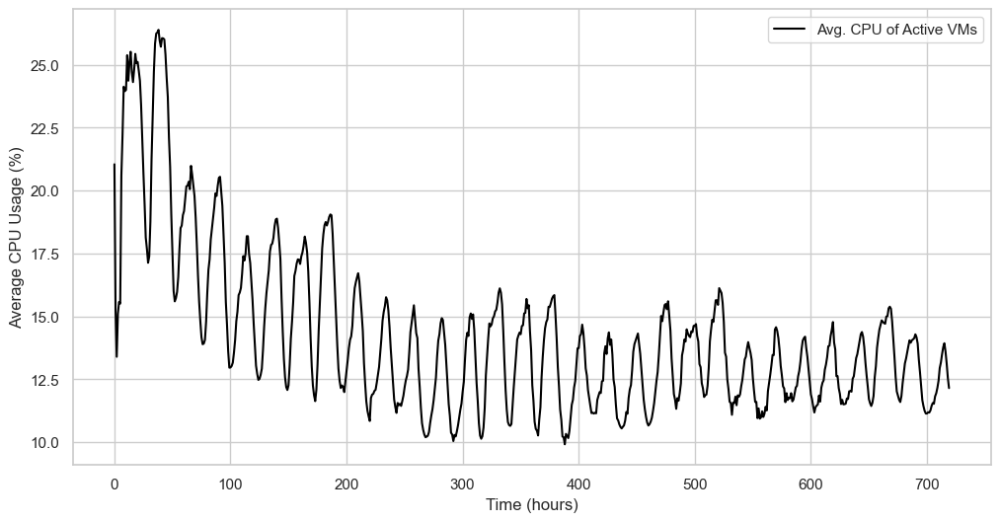

In [24]:
azure = pd.read_csv('../data/vmtable2.csv')
# Parse columns
azure.iloc[:, 0] = pd.to_numeric(azure.iloc[:, 0])  # vm_created (seconds)
azure.iloc[:, 1] = pd.to_numeric(azure.iloc[:, 1])  # vm_deleted (seconds)
azure.iloc[:, 3] = pd.to_numeric(azure.iloc[:, 3])  # avg_cpu

vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values
avg_cpu = azure.iloc[:, 3].values

# Set up a timeline grid (e.g. every hour)
time_step = 3600  # 1 hour in seconds
start = vm_created.min()
end = vm_deleted.max()
time_grid = np.arange(start, end + time_step, time_step)

avg_cpu_over_time = []

# For each time point, calculate avg CPU of running VMs
for t in time_grid:
    running_mask = (vm_created <= t) & (vm_deleted >= t)
    running_cpus = avg_cpu[running_mask]
    
    if len(running_cpus) > 0:
        avg_cpu_over_time.append(running_cpus.mean())
    else:
        avg_cpu_over_time.append(np.nan)

# Convert seconds to hours for x-axis
time_hours = time_grid / 3600

# Plot
plt.figure(figsize=(12, 6))
plt.plot(time_hours, avg_cpu_over_time, label='Avg. CPU of Active VMs', color='black')
plt.xlabel('Time (hours)')
plt.ylabel('Average CPU Usage (%)')
plt.grid(True)
plt.legend()
plt.show()

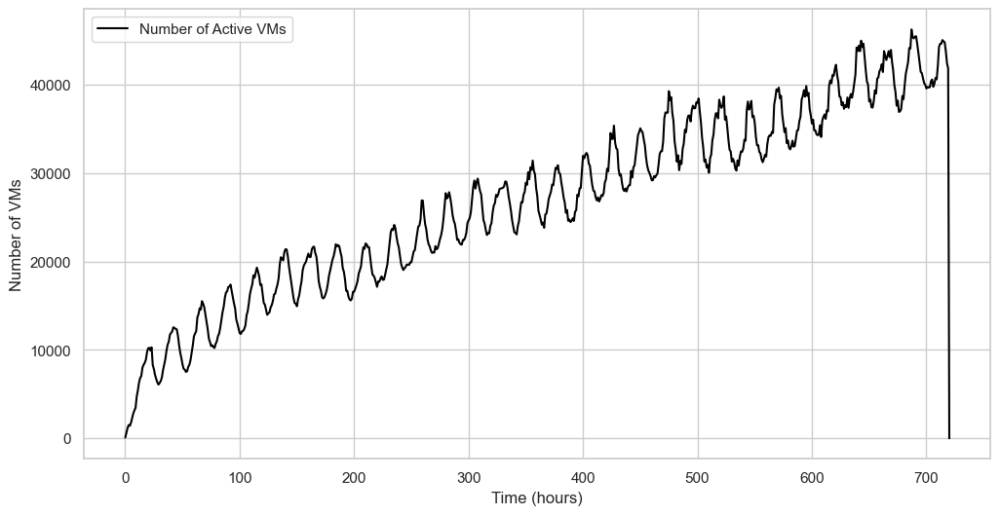

In [25]:
# Assuming azure dataframe is already loaded and columns parsed
vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values

time_step = 3600  # 1 hour in seconds
start = vm_created.min()
end = vm_deleted.max()
time_grid = np.arange(start, end + time_step, time_step)

active_vm_counts = []
for t in time_grid:
    running_mask = (vm_created <= t) & (vm_deleted >= t)
    active_vm_counts.append(np.sum(running_mask))

# Convert seconds to hours for x-axis
time_hours = time_grid / 3600

# Create a DataFrame for seaborn
plot_df = pd.DataFrame({
    'Time (hours)': time_hours,
    'Active VMs': active_vm_counts
})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.lineplot(data=plot_df, x='Time (hours)', y='Active VMs', color='black', label='Number of Active VMs')
plt.xlabel('Time (hours)')
plt.ylabel('Number of VMs')
plt.grid(True)
plt.legend()
plt.show()

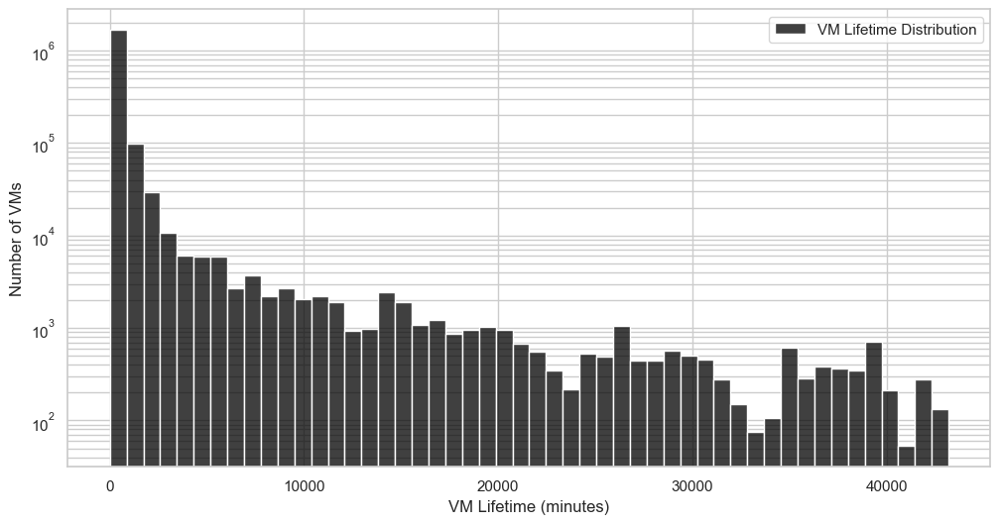

In [26]:
vm_created = azure.iloc[:, 0].values
vm_deleted = azure.iloc[:, 1].values

# Calculate VM lifetime in minutes
vm_lifetimes_minutes = (vm_deleted - vm_created) / 60  # convert seconds to minutes

# Prepare DataFrame for seaborn
plot_df = pd.DataFrame({'VM Lifetime (minutes)': vm_lifetimes_minutes})

sns.set(style="whitegrid")

plt.figure(figsize=(12, 6))
sns.histplot(
    data=plot_df,
    x='VM Lifetime (minutes)',
    bins=50,
    color='black',
    kde=False,
    label='VM Lifetime Distribution'
)
plt.xlabel('VM Lifetime (minutes)')
plt.ylabel('Number of VMs')
#plt.title('Distribution of VM Lifetimes (log scale)')
plt.yscale('log')  # Log scale on y-axis
plt.grid(True, which='both', axis='y')
plt.legend()  # Show legend
plt.show()